<a href="https://colab.research.google.com/github/pmama/ComputerVision/blob/main/YOLO_NAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src ='https://blog.roboflow.com/content/images/size/w1000/2023/08/what-is-object-detection.jpg'>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd /content/gdrive/MyDrive

/content/gdrive/MyDrive


In [ ]:
import os
if not os.path.isdir("yolov8nas"):
  os.makedirs("yolov8nas")

In [ ]:
%cd yolov8nas

/content/gdrive/MyDrive/yolov8nas


In [ ]:
#!pip install super-gradients

# **What is object detection?**
 object detection is a computer vision technique for identifying and locating objects in an image or a video object detection gives us the bounding box information of the object as well as the classification of that object.

  An object detection system will return the coordinates of the objects in an image that it has been trained to recognize. The system will also return a confidence level, which shows how confident the system is that a prediction is accurate.
 # **object classification vs. object recognition vs. object segmentation?**
 - **object classification :** object classification is a type of image recognition that identifies what type of
object is present in an image here the complete image is sent for classification so the output is a single class object detection is a type of image recognition that is used to identify
 - **object detection :** locate the presence of an object in an image this gives us the bounding box information and the class the results can be multiple bounding boxes and classes
 - **object segmentation  :** object segmentation is the type of image recognition that is used to identify and separate the distinct objects in an image on a pixel level here we get the exact shape of the object detected rather than just the bounding box

 # **History of object detection:**
 Object detection is a crucial task in computer vision that involves identifying and locating objects of interest within an image or a video. Over the years, various approaches have been developed to address the challenges of object detection, with notable methods including RCNN (Region-based Convolutional Neural Network), Fast R-CNN, Faster R-CNN, and YOLO (You Only Look Once).

# **Super_gradients**
details: [super-gradients](https://https://pypi.org/project/super-gradients/2.5.0/)

In [2]:
import super_gradients
from super_gradients.training import models
from super_gradients.common.object_names import Models

The console stream is logged into /root/sg_logs/console.log


[2023-11-28 03:07:12] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-11-28 03:07:12] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-11-28 03:07:12] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-11-28 03:07:19] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-28 03:07:19] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-28 03:07:19] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [3]:
yolo_nas = super_gradients.training.models.get('yolo_nas_l', pretrained_weights= "coco") #yolo_nas_l : Large

[2023-11-28 03:07:20] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-28 03:07:21] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary

In [ ]:
summary(model =yolo_nas, input_size= (16,3,640,640), # 16 channels and a resolution of 640x640
        col_names =['input_size','output_size','num_params','trainable'],
        col_width =20, row_settings =['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

[2023-11-28 03:07:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


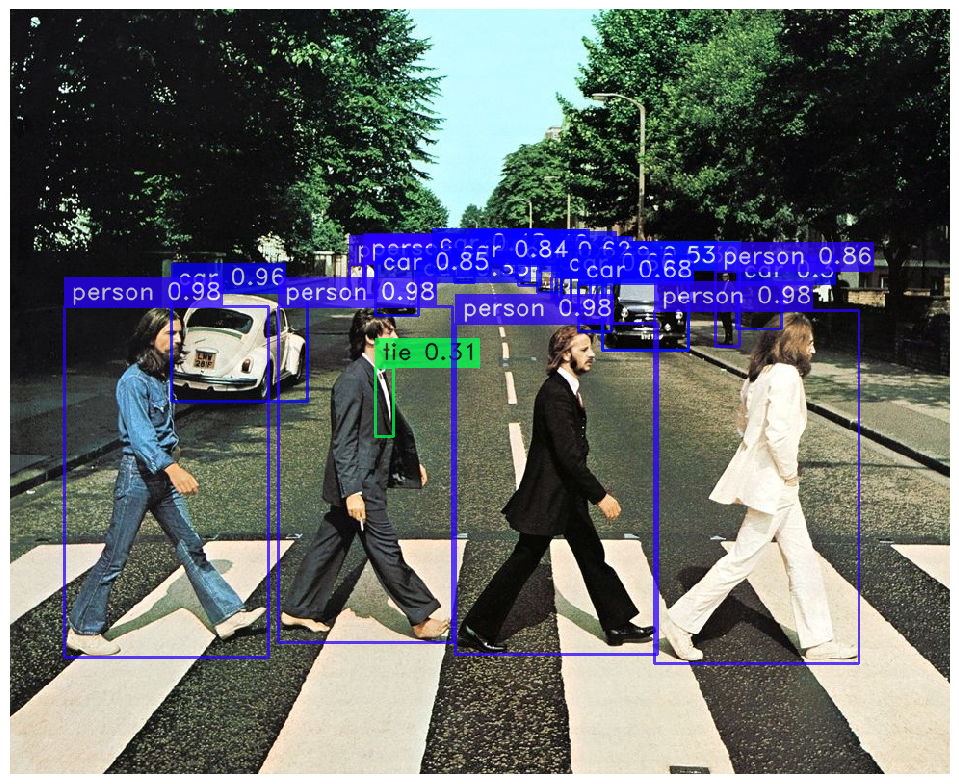

In [4]:
img_file2 ='/content/gdrive/MyDrive/yolov8nas/beatles-abbeyroad.jpg'
yolo_nas.predict(img_file2, conf =0.25).show()

[2023-11-28 02:23:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


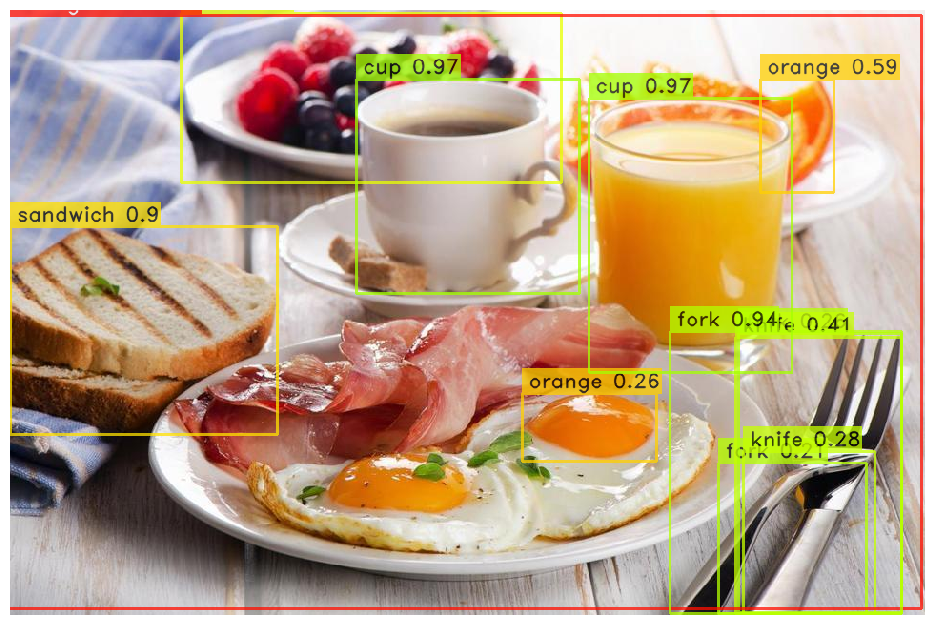

In [ ]:
img_file5= '/content/gdrive/MyDrive/yolov8nas/Protein-Breakfast.jpg'

yolo_nas.predict(img_file5, conf =0.20).show()

In [ ]:
yolo_nas_s = super_gradients.training.models.get('yolo_nas_s', pretrained_weights= "coco")

[2023-11-28 02:24:15] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-28 02:24:15] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_s


# **YOLOX_S**

/usr/local/lib/python3.10/dist-packages/super_gradients/common/deprecate.py:168: DeprecationWarning: Parameter `arch_params.channels_in` is deprecated since version `3.3.0` and will be removed in version `4.0.0`.
Please update your code to use the `arch_params.in_channels` instead of `arch_params.channels_in`.
  warnings.warn(message, DeprecationWarning)
[2023-11-28 02:24:35] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolox_s
[2023-11-28 02:24:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classe

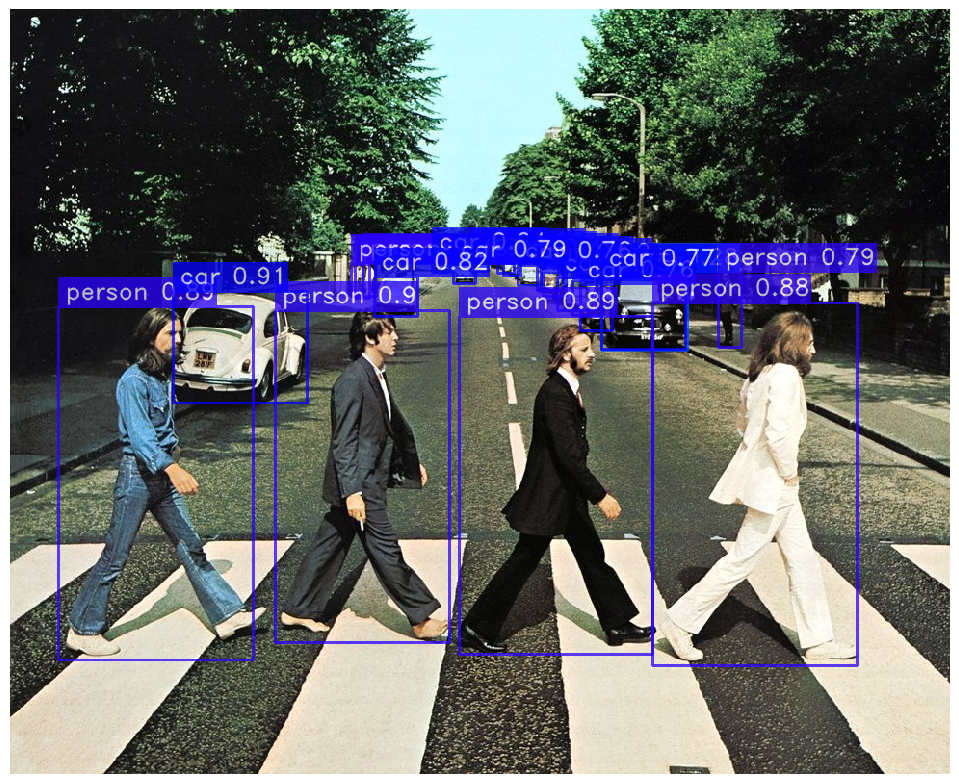

In [ ]:
yolox = super_gradients.training.models.get(Models.YOLOX_S, pretrained_weights="coco")
yolox.predict(img_file2, conf=0.25).show()

# **ResNet50**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[2023-11-28 01:45:53] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture resnet50
[2023-11-28 01:45:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


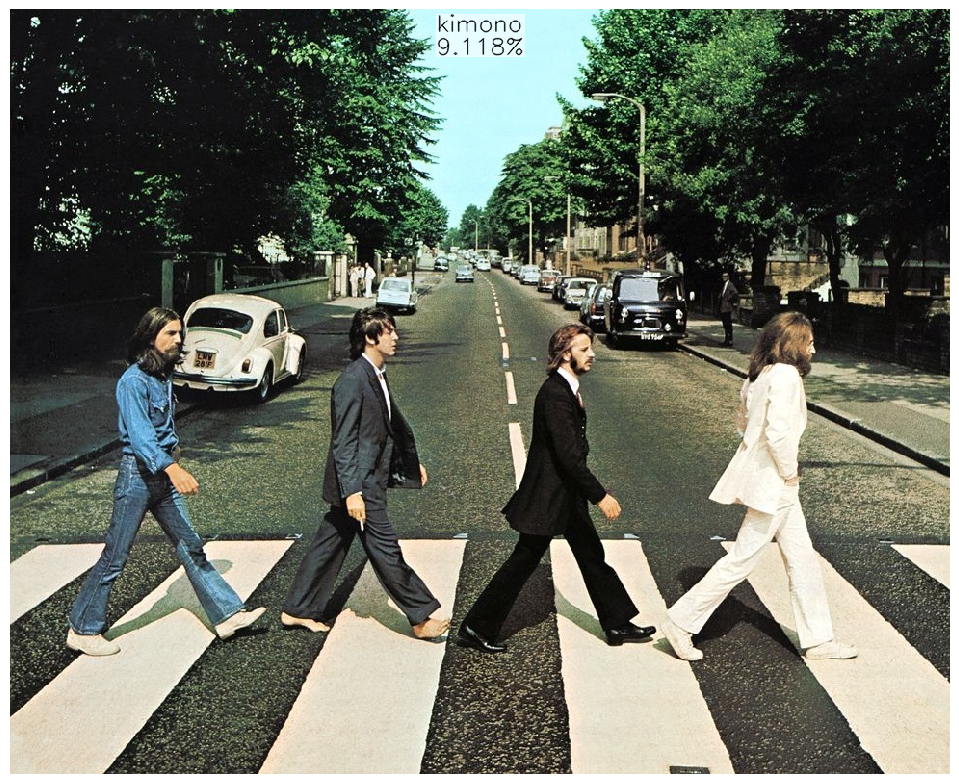

In [ ]:
resnet = super_gradients.training.models.get(Models.RESNET50, pretrained_weights="imagenet")
resnet.predict(img_file2).show()

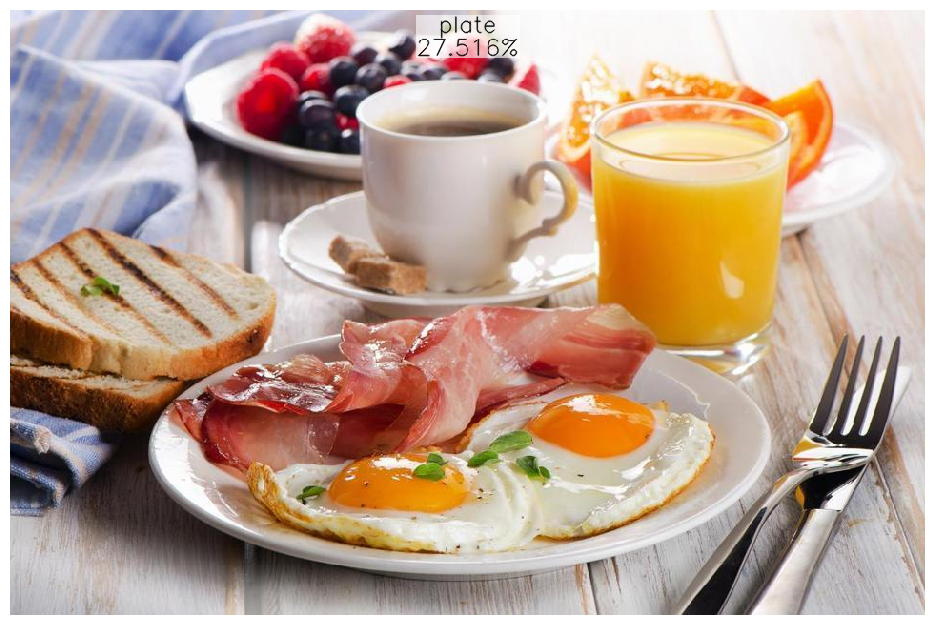

In [ ]:
resnet.predict(img_file1).show()

# **# YOLO-NAS POSE**

[2023-11-28 02:33:36] INFO - checkpoint_utils.py - License Notification: YOLO-NAS-POSE pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS-POSE.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-28 02:33:37] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_pose_l
[2023-11-28 02:33:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


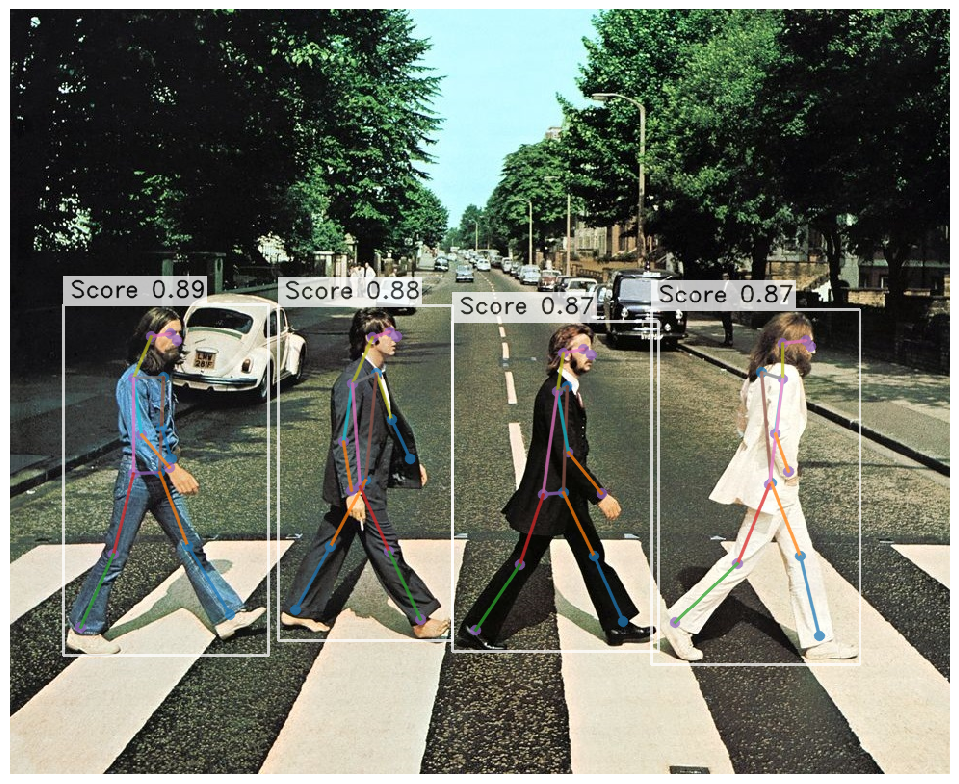

In [ ]:
yolo_nas_pose = super_gradients.training.models.get("yolo_nas_pose_l", pretrained_weights="coco_pose").cuda()
model_predictions  = yolo_nas_pose.predict(img_file2, conf=0.5).show()



In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
video_file1_in =f'/content/gdrive/MyDrive/yolov8nas/small_video.mp4'
video_file1_out =f'/content/gdrive/MyDrive/yolov8nas/output1.mp4'
yolo_nas.to(device).predict(video_file1_in, conf =0.25).save(video_file1_out)

Processing Video:  98%|█████████▊| 731/743 [00:32<00:00, 32.36it/s]

In [ ]:

from IPython.display import Video

# Specify the path to your video file
video_path ='https://youtube.com/clip/UgkxKHf-aHU2Ks78e0lnwlGJuJ0K6bdSbn3V?si=ySvTNZw_FM9eCgfQ'

# Display the video
Video(video_file1_out)